Universidad Nacional de Colombia<br/>
Robotica y Control Servo-Visual<br/>
Luis Antonio Zuluaga Ramirez<br/>
Luis Miguel Martinez Largo<br/>
24/05/2020

<h1 align="center" style="color:blue;">  Taller #3: Calibracion de camara</h1>

<h2 align="center" style="color:blue;"> introducción </h2>
<p> A continuación se muestra el proceso de calibración de Cámara para obtener los parámetros internos de la Cámara; en este caso se realizará el análisis para la Cámara web incluida en un computador portátil, la cual tiene una resolución HD (128x720p. Este análisis tiene un gran beneficio en el momento de reconstruir escenas y objetos del mundo real, ya que se puede encontrar una relación entre los pixeles de la Cámara y el mundo real, pudiendo así determinar distancias y profundidad.</p>

<h3> Marco teórico </h3>
Este modelo se basa en la proyección de los puntos en una escena 3D sobre la imagen, para ello se utiliza una transformación de perspectiva:

$$ s\begin{bmatrix}
    u\\
    v\\
    1
    \end{bmatrix} = 
    \begin{bmatrix} 
        f_x & 0 & c_x\\
        0 & f_y & c_y\\
        0 & 0 & 1
    \end{bmatrix}
    \begin{bmatrix}
        r_{11} & r_{12} & r_{13} & t_1\\
        r_{21} & r_{22} & r_{23} & t_2\\
        r_{31} & r_{32} & r_{33} & t_3
    \end{bmatrix}
    \begin{bmatrix}
        X\\
        Y\\
        Z\\
        1
    \end{bmatrix}
    $$

Donde:
<ul>
    <li>$ (X,Y,Z) $  Son las coordenadas de un punto 3D en el exterior </li>
    <li>$ (u,v) $ Son las coordenadas del punto proyectado en pixeles</li>
    <li>$ (c_x,c_y) $ Es un punto importante, ya que suele ser el centro de la Cámara</li>
    <li>$ (f_x,f_y) $ Son las distancias focales de la Cámara expresadas en pixeles </li>
    <li>$ [R|t] $ Es la matriz conjunta de rotación-traskación o matriz de parámetros extrínsecos </li>
</ul>

Debido a que los valores $ f_x, f_y, c_x, c_y $ son valores fijos de la Cámara, la matriz que los contiene se conoce como matriz de parámetros intrínsecos, esto siempre y cuando la distancia focal se mantenga (sin zoom). después de conocer los valores intrínsecos de la Cámara se pueden utilizar junto con la matriz de rotación-traslación para describir el movimiento de la Cámara alrededor de una escena estática, o viceversa, es decir:

$$ \begin{bmatrix}
        x\\
        y\\
        z
   \end{bmatrix} = 
   R
   \begin{bmatrix}
       X\\
       Y\\
       Z
   \end{bmatrix}+t$$
$$ \dot{x} = \frac{x}{z}\\
   \dot{y} = \frac{y}{z}\\
   u = f_x\cdot \dot{x} + c_x\\
   v = f_y\cdot \dot{y} + c_y $$

<img src="Imagenes/model_camara.PNG">

Por lo general las lentes tienen principalmente una distorsión radial y una ligera distorsión tangencial; la distorsión radial causa que las líneas rectas aparezcan curvas, este efecto se aumenta a medida que se aleja del centro de la Cámara:
<img src="Imagenes/distorision.PNG">
La distorsión radial se resuelve:
$$ x_{corregido} = x(1+k_1r^2+k_2r^4+k_3r^6)\\
   y_{corregido} = y(1+k_1r^2+k_2r^4+k_3r^6) $$

Por otro lado la distorsión tangencial ocurre porque el lente que toma la imagen no está alineado perfectamente paralelo al plano de la imagen; esto puede generar que algunas áreas de la imagen puedan verse más cerca de lo esperado. Esto se puede resolver de la siguiente manera:

$$ x_{corregido}=x+(2p_1xy+p_2(r^2+2x^2))\\
   y_{corregido} = y + (p_1(r^2+2y^2)+2p_2xy)
$$

Es necesario encontrar los coeficientes de distorsión:
$$ Coeficientes~ de~ distorsion = (k_1,k_2,p_1,p_2,k_3)$$

En resumen la meta de la calibración de Cámara es estimar:

<ol>
    <li>Distancia focal del lente en el eje $x$ ($f_x$).</li>
    <li>Distancia focal del lente en el eje $y$ ($f_y$).</li>
    <li>Desplazamiento del lente en el eje $x$ ($c_x$).</li>
    <li>Desplazamiento del lente en el eje $y$ ($c_y$).</li>
    <li>parámetros de la distorsión radial</li>
    <li>parámetros de la distorsión tangencial</li>
    <li>La posición de la Cámara en el mundo real ($x,y,z$), es decir, la traslación de la cámara</li>
    <li>La orientación de la cámara en el mundo real, es decir, la rotación de la cámara</li>
</ol>


        

<h2 align="center" style="color:blue;"> Calibración de Cámara</h2>
<p> Esta primera parte del codigo fue utilizada para tomar las fotos del tablero con la web cam</p>

In [15]:
import cv2
from matplotlib import pyplot as plt
cam = cv2.VideoCapture(0)                                #Se importa el capturador de video

cv2.namedWindow("Foto")                                  #Nombre de la ventana emergente

img_counter = 0 

while True:                                              #Se mantienen operando la webcam hasta presionar la letra Esc
    ret, frame = cam.read()                              #Accede a los datos de la web cam
    if not ret:
        print("No fue posible obtener el marco")
        break
    #frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    cv2.imshow("Foto", frame)                            #Muestra la imagen en tiempo real captada por la web cam

    k = cv2.waitKey(1)                                   #Presionar tecla Esc para salir del bucle while y cerrar el programa
    if k%256 == 27:
        # ESC pressed
        print("Presione la tecla (Esc) para salir")
        break
    elif k%256 == 32:                                    #Presiona la tecla espaciadora para tomar una foto
        # SPACE pressed
        img_name = "Imagenes/Web-cam/wc_chess_{}.png".format(img_counter) #Nombre de como se guardara la imagen tomada
        cv2.imwrite(img_name, frame)
        print("{} Guardada".format(img_name))
        img_counter += 1

cam.release()

cv2.destroyAllWindows()

Presione la tecla (Esc) para salir


<h3> Encontrando los corners internos de el tablero</h3>

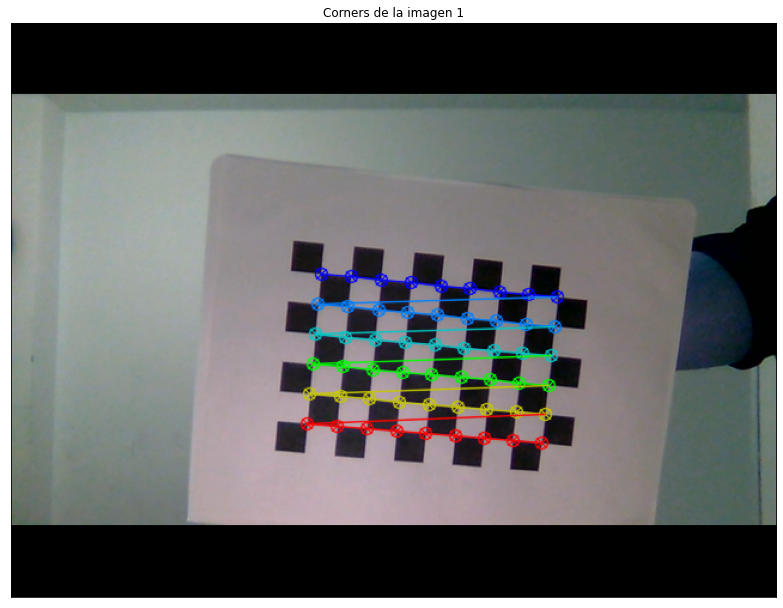

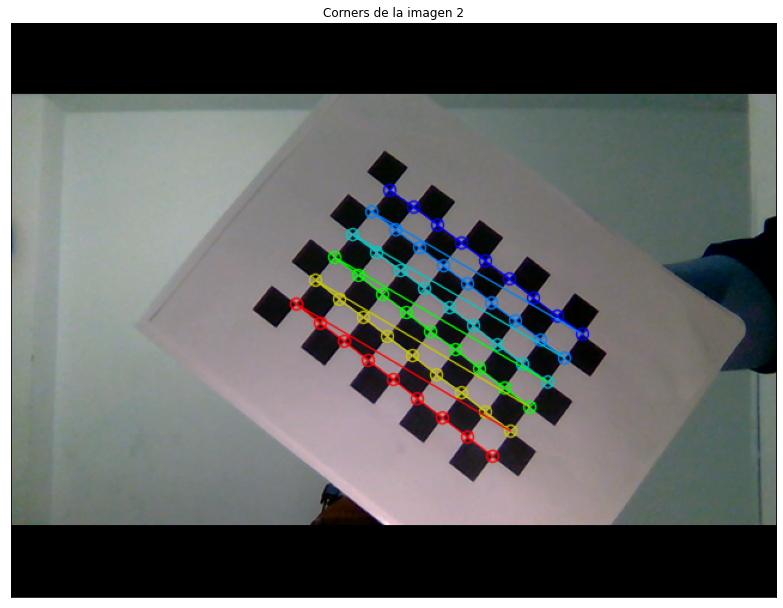

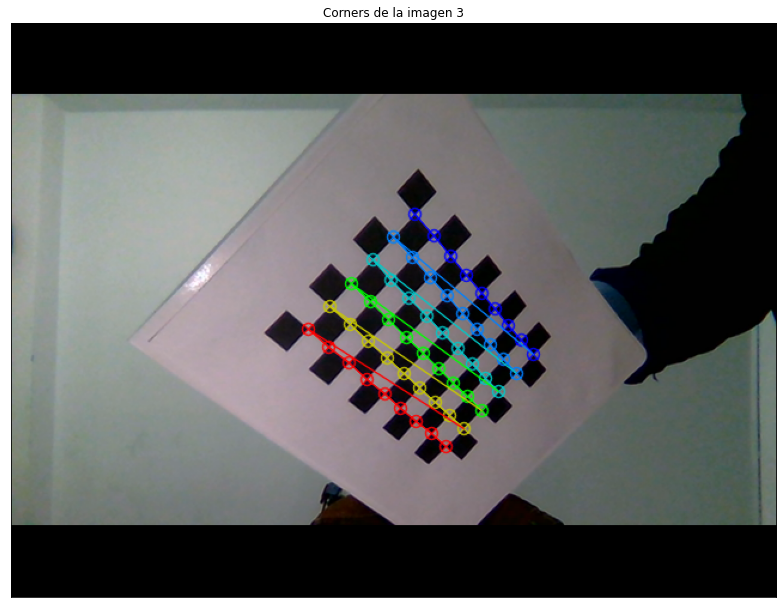

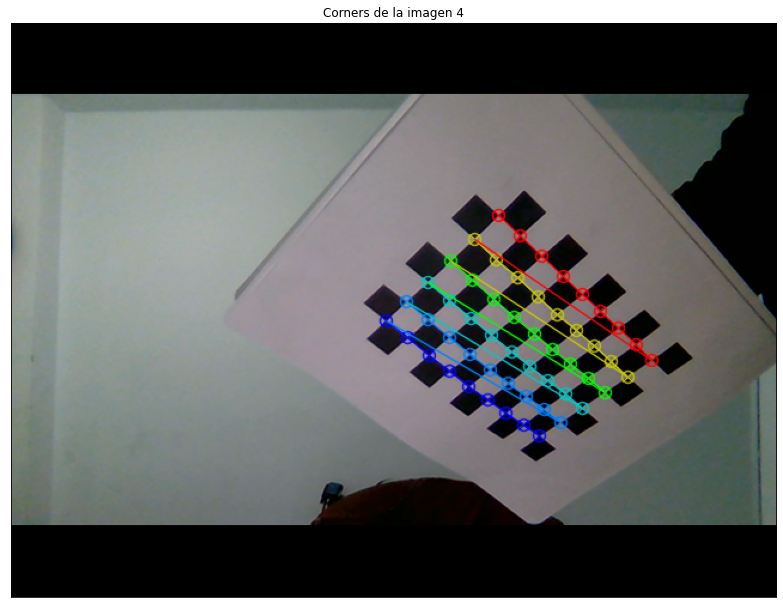

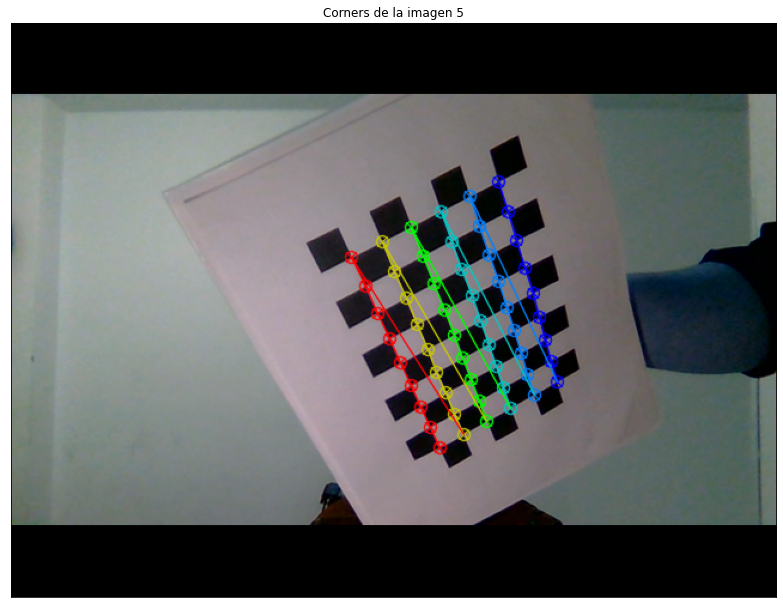

...

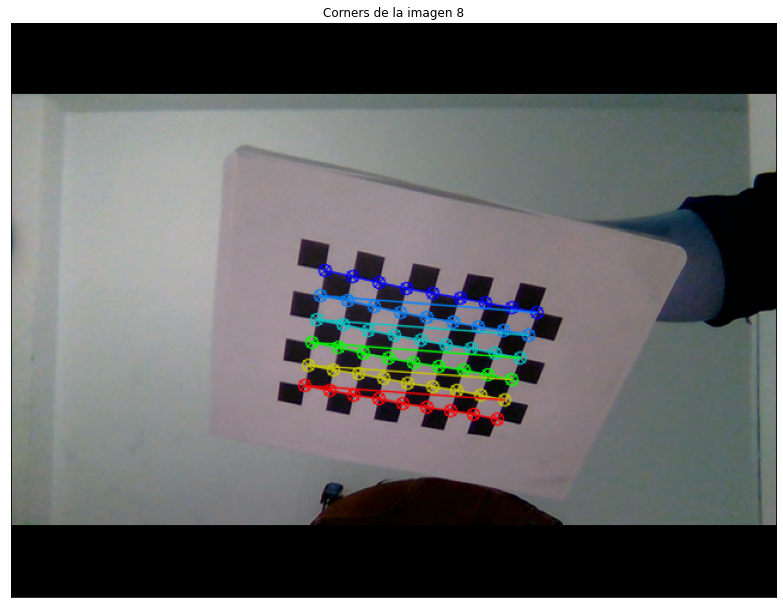

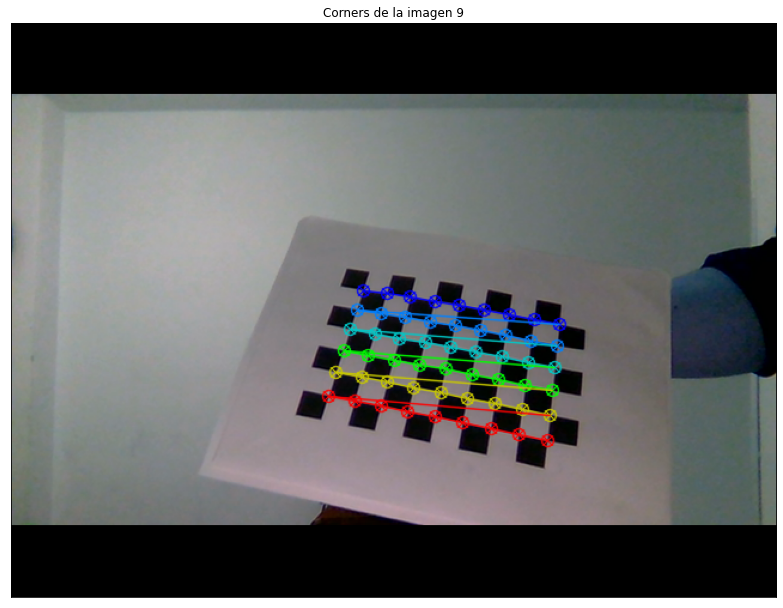

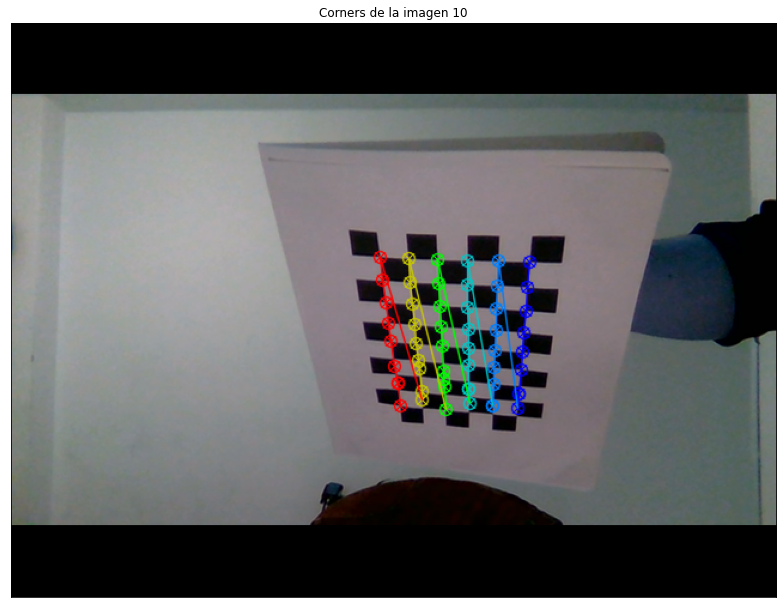

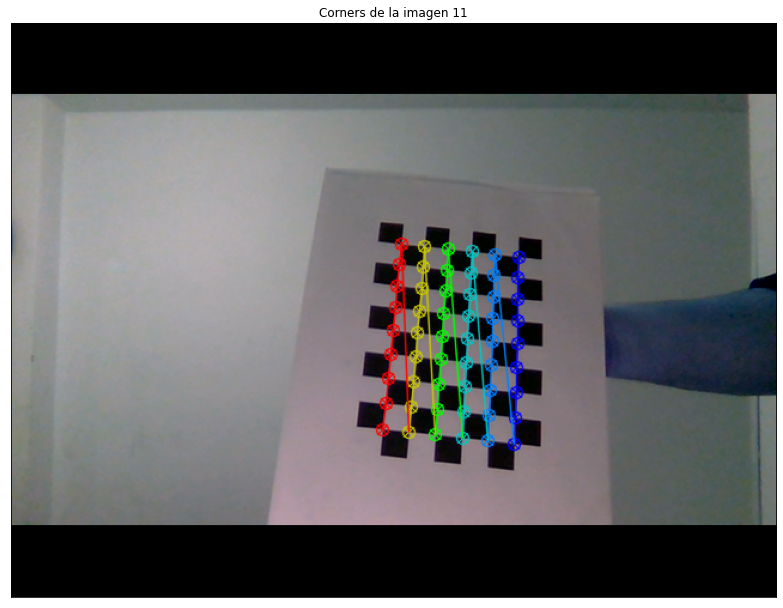

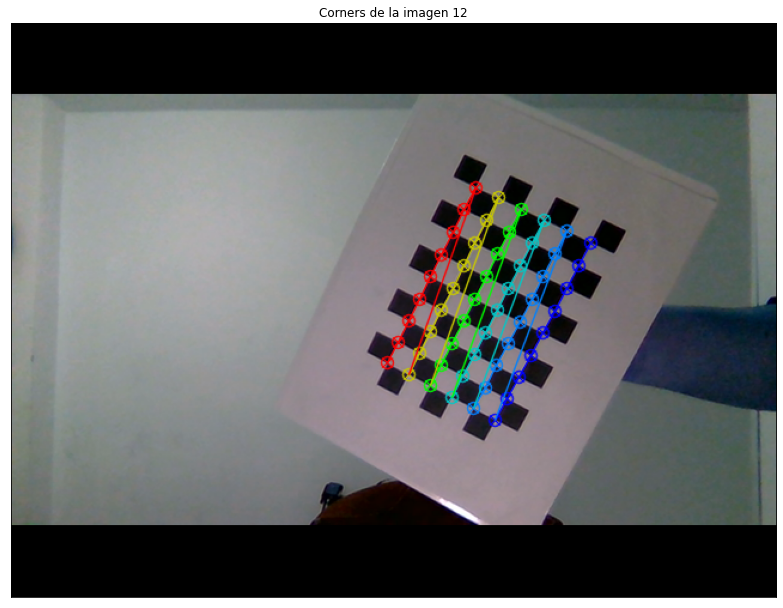

In [99]:
import numpy as np
import cv2
import glob

# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane.

images = glob.glob('Imagenes/Web-cam/*.png')
#print(images)
i=1
for fname in images:
    #print(fname)
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    # Find the chess board corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
   # print(ret)

    # If found, add object points, image points (after refining them)
    if ret == True:
        objpoints.append(objp)

        corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        imgpoints.append(corners2)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners2,ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)
        plt.figure(figsize=(150, 150))
        plt.subplot(12,1,i), plt.imshow(img, cmap=plt.cm.gray),plt.xticks([]), plt.yticks([])
        plt.title('Corners de la imagen '+str(i))
        i = i+1
plt.show()
cv2.imshow('img',img)
cv2.destroyAllWindows()

<h3> Calibración</h3>

In [101]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)

<h3> Matriz de parametros intrinsecos</h3>

In [102]:
print(mtx)

[[444.6780708    0.         299.16455326]
 [  0.         443.24955684 266.48587046]
 [  0.           0.           1.        ]]


<h3> Coeficientes de distorsión </h3>

In [103]:
print(dist)

[[-0.09311555  0.02034627 -0.0051006  -0.00154949  0.27904435]]


<h3> Vectores de rotacion </h3>

In [74]:
print(rvecs)

[array([[ 0.24276039],
       [-0.38126198],
       [ 1.0539169 ]]), array([[ 0.0372027 ],
       [-0.16553006],
       [ 0.87753454]]), array([[-0.49938428],
       [-0.62873727],
       [ 0.56480121]]), array([[-0.36318742],
       [ 0.5347671 ],
       [ 0.29922499]]), array([[-0.86930281],
       [-0.01050913],
       [ 0.04367154]]), array([[-0.13291858],
       [ 0.05552202],
       [ 0.02962515]]), array([[-0.87040626],
       [ 0.34996854],
       [ 0.6786512 ]]), array([[-0.06778842],
       [-0.00527704],
       [ 0.69097973]]), array([[ 0.05428552],
       [-0.01298288],
       [ 3.11119675]]), array([[ 0.17140267],
       [-0.20496759],
       [ 1.06985049]]), array([[-0.16299412],
       [ 0.02786612],
       [-1.03319124]]), array([[-0.11676025],
       [-0.00636005],
       [-1.54316802]])]


<h3> Vectores de traslación</h3>

In [104]:
print(tvecs)

[array([[-1.60728408],
       [-2.24070966],
       [17.58638751]]), array([[ 0.68754675],
       [-5.1289489 ],
       [17.8738004 ]]), array([[ 1.4613168 ],
       [-4.04728163],
       [16.81900116]]), array([[ 6.64359431],
       [ 3.74107422],
       [20.45387629]]), array([[ 3.88887568],
       [-4.77402646],
       [15.7363842 ]]), array([[ 4.86253957],
       [-4.68754352],
       [20.65506565]]), array([[-1.54925661],
       [-4.41170295],
       [19.83896681]]), array([[-1.60775441],
       [-2.51618238],
       [18.95668979]]), array([[-0.2418931 ],
       [-2.17841816],
       [22.18139606]]), array([[ 5.11431661],
       [-2.44712837],
       [16.69068831]]), array([[ 6.33811759],
       [-3.61270599],
       [22.49837193]]), array([[ 8.66498179],
       [-3.9003253 ],
       [20.51741573]])]


<h3> Corrección de distorsion de la imagen</h3>

(20, 29, 589, 435)
(20, 29, 589, 435)
(20, 29, 589, 435)
(20, 29, 589, 435)
(20, 29, 589, 435)
(20, 29, 589, 435)
(20, 29, 589, 435)
(20, 29, 589, 435)
(20, 29, 589, 435)
(20, 29, 589, 435)
(20, 29, 589, 435)
(20, 29, 589, 435)


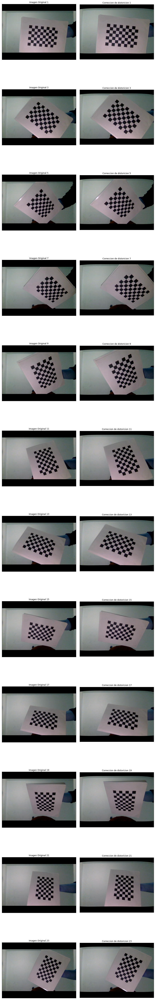

In [105]:
i=0
images = glob.glob('Imagenes/Web-cam/*.png')
for fname in images:
    #print(fname)
    img = cv2.imread(fname)
    h,  w = img.shape[:2]
    newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))
    print(roi)
    # undistort
    dst = cv2.undistort(img, mtx, dist, None, newcameramtx)

    # crop the image
    x,y,w,h = roi
    dst = dst[y:y+h, x:x+w]
    cv2.imwrite('calibresult.png',dst)
   
    i=i+1
    plt.subplot(12,2,i), plt.imshow(img, cmap=plt.cm.gray),plt.xticks([]), plt.yticks([])
    plt.title('Imagen Original '+str(i))
    i=i+1
    plt.subplot(12,2,i), plt.imshow(dst, cmap=plt.cm.gray),plt.xticks([]), plt.yticks([])
    plt.title('Correccion de distoricion '+str(i-1))
plt.subplots_adjust(top=20, bottom=0.2, left=0.01, right=2, hspace=0.21, wspace=0.05)
plt.show()
    

(20, 29, 589, 435)
(20, 29, 589, 435)
(20, 29, 589, 435)
(20, 29, 589, 435)
(20, 29, 589, 435)
(20, 29, 589, 435)
(20, 29, 589, 435)
(20, 29, 589, 435)
(20, 29, 589, 435)
(20, 29, 589, 435)
(20, 29, 589, 435)
(20, 29, 589, 435)


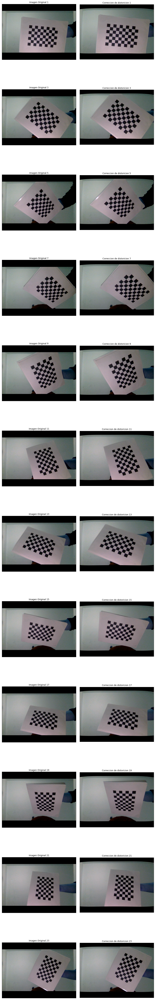

In [106]:
  
i=0
images = glob.glob('Imagenes/Web-cam/*.png')
for fname in images:
    #print(fname)
    img = cv2.imread(fname)
    h,  w = img.shape[:2]
    newcameramtx, roi=cv2.getOptimalNewCameraMatrix(mtx,dist,(w,h),1,(w,h))
    print(roi)
     # undistort
    mapx,mapy = cv2.initUndistortRectifyMap(mtx,dist,None,newcameramtx,(w,h),5)
    dst = cv2.remap(img,mapx,mapy,cv2.INTER_LINEAR)

    # crop the image
    x,y,w,h = roi
    dst = dst[y:y+h, x:x+w]
    cv2.imwrite('calibresult.png',dst)
   
    i=i+1
    plt.subplot(12,2,i), plt.imshow(img, cmap=plt.cm.gray),plt.xticks([]), plt.yticks([])
    plt.title('Imagen Original '+str(i))
    i=i+1
    plt.subplot(12,2,i), plt.imshow(dst, cmap=plt.cm.gray),plt.xticks([]), plt.yticks([])
    plt.title('Correccion de distoricion '+str(i-1))
plt.subplots_adjust(top=20, bottom=0.2, left=0.01, right=2, hspace=0.21, wspace=0.05)
plt.show()

<h3> Error</h3>

In [68]:
mean_error = 0
for i in range(len(objpoints)):
    imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    error = cv2.norm(imgpoints[i],imgpoints2, cv2.NORM_L2)/len(imgpoints2)
    mean_error += error

print ("total error: ", mean_error/len(objpoints))

total error:  0.08201613569476641
